# GAN Moment Painting Mini Project

This project is about building a GAN. GAN consists of two neuronal networks: a generator and a discriminator. The generator is a neuronal network (NN) that creates an image. The discriminator is another NN that validates that the image follows the desired style.

In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import glob
import random
import cv2
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Flatten, Reshape, Conv2D, Conv2DTranspose, LeakyReLU, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os

### Exploratory Data Analysis (EDA) 

In [3]:
def show_sample_images(paths):
    print(f'Total number of images: {len(paths)}')

    fig, axes = plt.subplots(2, 5, figsize=(12, 6))

    for ax, img_path in zip(axes.flatten(), random.sample(paths, 10)):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis("off")

    plt.tight_layout()
    plt.show()



Total number of images: 300


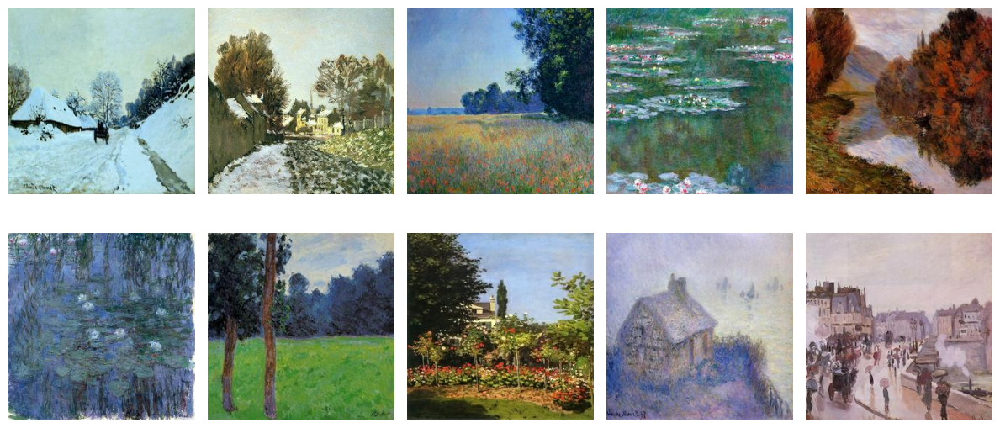

In [4]:
monet_paths = glob.glob("data/monet_jpg/*.jpg")

show_sample_images(monet_paths)

Total number of images: 7038


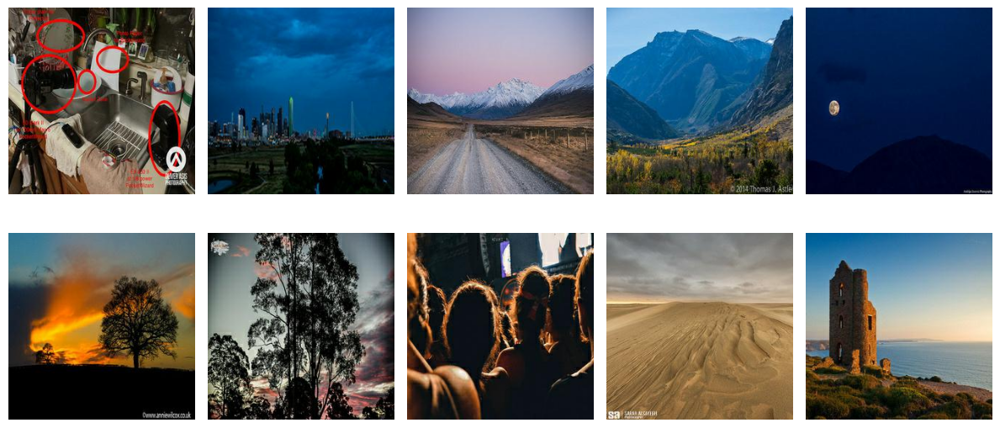

In [5]:
photo_paths = glob.glob("data/photo_jpg/*.jpg")

show_sample_images(photo_paths)

<Figure size 800x400 with 0 Axes>

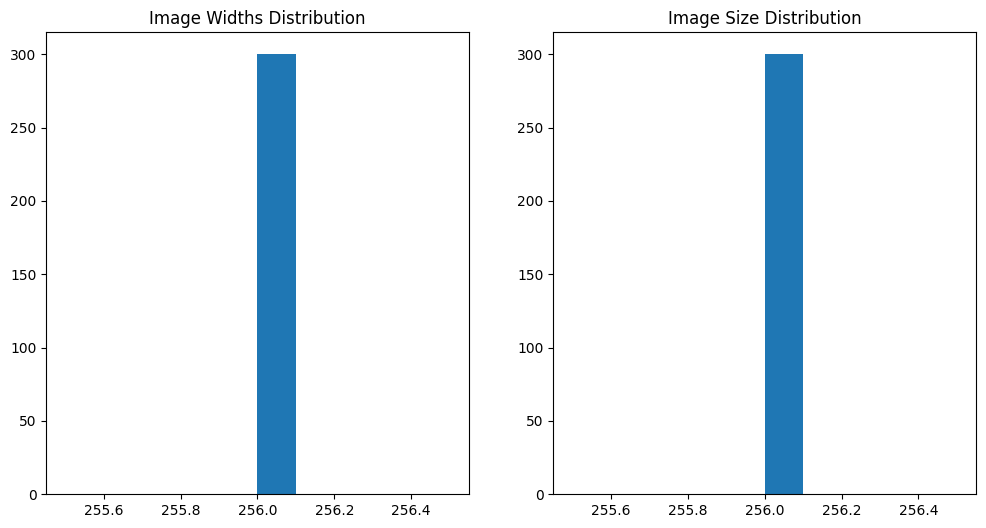

In [42]:
image_shapes = [Image.open(img).size for img in monet_paths]
widths, heights = zip(*image_shapes)

plt.figure(figsize=(8, 4))

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].hist(widths)
axes[0].set_title(f"Image Widths Distribution")

axes[1].hist(heights)
axes[1].set_title(f"Image Heights Distribution")

plt.title("Image Size Distribution")
plt.show()

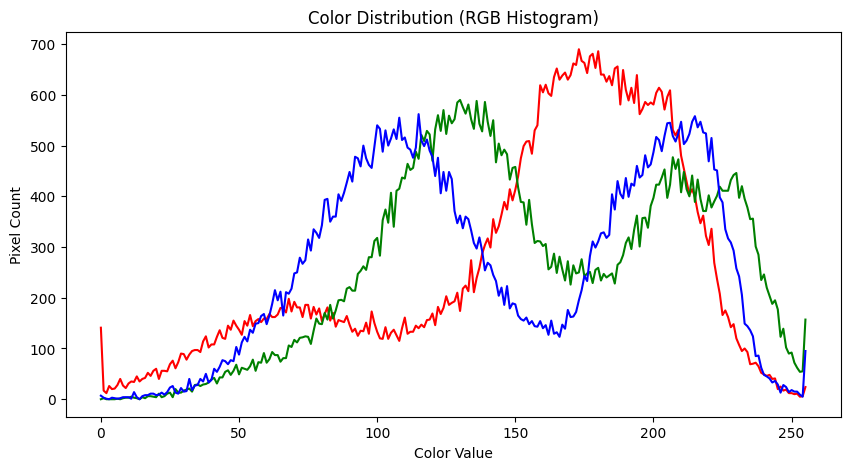

In [43]:
img = cv2.imread(monet_paths[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
color = ('r', 'g', 'b')
for i, col in enumerate(color):
    hist = cv2.calcHist([img], [i], None, [256], [0, 256])
    plt.plot(hist, color=col)

plt.title("Color Distribution (RGB Histogram)")
plt.xlabel("Color Value")
plt.ylabel("Pixel Count")
plt.show()

data/monet_jpg/47a0548067.jpg


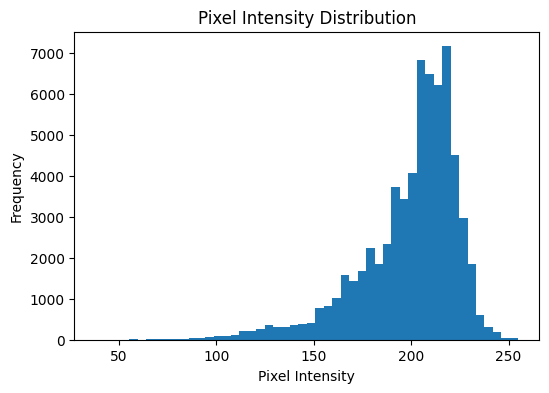

In [44]:
random_img_path = np.random.choice(monet_paths)

print(random_img_path)

img = cv2.imread(random_img_path, cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(6, 4))
plt.hist(img.ravel(), bins=50)
plt.title("Pixel Intensity Distribution")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

### DBModel Architecture

The first component of our model is the generator. This NN received an input noise and applied some operations to generate an image.

In [84]:
def build_generator(latent_dim=100):
    model = keras.Sequential([
        Dense(16 * 16 * 512, use_bias=False, input_shape=(latent_dim,), kernel_initializer="glorot_uniform"),
        BatchNormalization(),
        LeakyReLU(),
        Reshape((16, 16, 512)),

        Conv2DTranspose(256, (4, 4), strides=(2, 2), padding="same", use_bias=False),
        BatchNormalization(),
        LeakyReLU(),

        Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same", use_bias=False),
        BatchNormalization(),
        LeakyReLU(),

        Conv2DTranspose(64, (4, 4), strides=(2, 2), padding="same", use_bias=False),
        BatchNormalization(),
        LeakyReLU(),

        Conv2DTranspose(3, (4, 4), strides=(2, 2), padding="same", activation="tanh"),
    ])

    return model

latent_dim = 100
generator = build_generator(latent_dim)
generator.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                      │ (None, 131072)              │      13,107,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 131072)              │         524,288 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_16 (LeakyReLU)           │ (None, 131072)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_2 (Reshape)                  │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_8 (Conv2DTranspose) │ (None, 32, 32, 256)         │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_17 (LeakyReLU)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_9 (Conv2DTranspose) │ (None, 64, 64, 128)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_18 (LeakyReLU)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_10                  │ (None, 128, 128, 64)        │         131,072 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_19 (LeakyReLU)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_11                  │ (None, 256, 256, 3)         │           3,075 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,388,867 (62.52 MB)

 Trainable params: 16,125,827 (61.52 MB)

 Non-trainable params: 263,040 (1.00 MB)

The second component of the GAN is the discriminat NN. This NN recive an image candidate as input and after apply mulitple operations determine if the image is a good candidate or not.

In [87]:
IMG_SIZE = 256

def build_discriminator(img_shape=(IMG_SIZE, IMG_SIZE, 3)):
    model = keras.Sequential([
        Conv2D(64, (4, 4), strides=(2, 2), padding="same", input_shape=img_shape),
        LeakyReLU(0.2),
        Dropout(0.3),

        Conv2D(128, (4, 4), strides=(2, 2), padding="same"),
        BatchNormalization(),
        LeakyReLU(0.2),
        Dropout(0.3),

        Conv2D(256, (4, 4), strides=(2, 2), padding="same"),
        BatchNormalization(),
        LeakyReLU(0.2),
        Dropout(0.3),

        Flatten(),
        Dense(1, activation="sigmoid"),
    ])

    return model

discriminator = build_discriminator()
discriminator.summary()


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)                   │ (None, 128, 128, 64)        │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_27 (LeakyReLU)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 64, 64, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_28 (LeakyReLU)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 32, 32, 256)         │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_29 (LeakyReLU)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 262144)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │         262,145 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 922,561 (3.52 MB)

 Trainable params: 921,793 (3.52 MB)

 Non-trainable params: 768 (3.00 KB)

In [94]:
loss_fn = keras.losses.BinaryCrossentropy()

lr = 0.0002
beta1 = 0.5
optimizer_G = Adam(lr, beta_1=beta1)
optimizer_D = Adam(lr, beta_1=beta1)

discriminator.compile(
    loss=loss_fn,
    optimizer=optimizer_D,
    metrics=["accuracy"])

Now, we are goig to build the GAN. combining the generator and discriminator.

In [95]:
def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = keras.Input(shape=(latent_dim,))
    generated_image = generator(gan_input)
    gan_output = discriminator(generated_image)

    gan = keras.Model(gan_input, gan_output)
    gan.compile(loss=loss_fn, optimizer=optimizer_G)
    return gan

gan = build_gan(generator, discriminator)
gan.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_4 (Sequential)            │ (None, 256, 256, 3)         │      16,388,867 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_7 (Sequential)            │ (None, 1)                   │         922,561 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,311,428 (66.04 MB)

 Trainable params: 16,125,827 (61.52 MB)

 Non-trainable params: 1,185,601 (4.52 MB)

Then, we are going to implement the training GAN algorithm. The training model uses random noise to generate new images and compute the loss function for real and fake images. After 500 training iterations, we display the image to validate the result.

In [106]:
epochs = 20000
batch_size = 32
save_interval = 500

def train_gan(dataset, epochs, batch_size, save_interval):
    half_batch = batch_size // 2

    for epoch in range(epochs):
        idx = np.random.randint(0, dataset.shape[0], half_batch)
        real_images = dataset[idx]
        
        noise = np.random.randn(half_batch, latent_dim)
        fake_images = generator.predict(noise)

        real_labels = np.ones((half_batch, 1)) * 0.9
        fake_labels = np.zeros((half_batch, 1)) + 0.1

        d_loss_real = discriminator.train_on_batch(real_images, real_labels)
        d_loss_fake = discriminator.train_on_batch(fake_images, fake_labels)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        for _ in range(2):
          noise = np.random.randn(batch_size, latent_dim)
          misleading_labels = np.ones((batch_size, 1))
          g_loss = gan.train_on_batch(noise, misleading_labels)

        if epoch % 100 == 0:
            print(f"Epoch {epoch}/{epochs}  D Loss: {d_loss[0]:.4f}, G Loss: {g_loss:.4f}")

        if epoch % save_interval == 0:
            display_image(generator)

def display_image(generator):
    num_images = 5
    noise = np.random.randn(num_images, latent_dim)
    generated_images = generator.predict(noise)
    generated_images = (generated_images + 1) / 2.0

    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(1, 5, i + 1)
        plt.imshow(generated_images[i])
        plt.axis("off")
    plt.show()


In [101]:
def load_images(data_dir, img_size=256):
    images = []
    for filename in os.listdir(data_dir):
        if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
            img = load_img(os.path.join(data_dir, filename), target_size=(img_size, img_size))
            img = img_to_array(img)
            img = (img - 127.5) / 127.5
            images.append(img)
    return np.array(images, dtype=np.float32)


dataset = load_images('data/monet_jpg/', img_size=IMG_SIZE)
print(f"Loaded {dataset.shape[0]} images of shape {dataset.shape[1:]}")

Loaded 300 images of shape (256, 256, 3)


(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
Epoch 0/20000  D Loss: 6.6511, G Loss: 0.0010
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


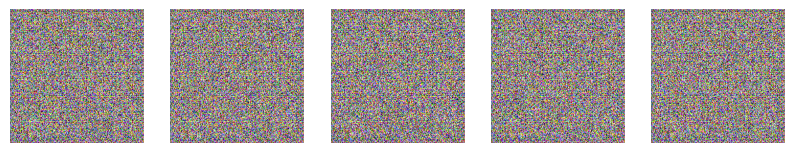

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

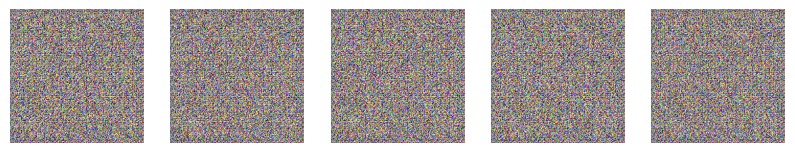

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

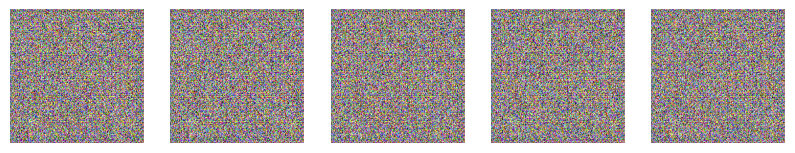

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

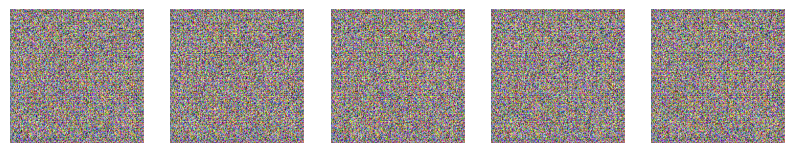

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

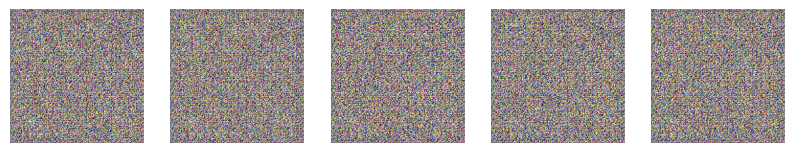

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

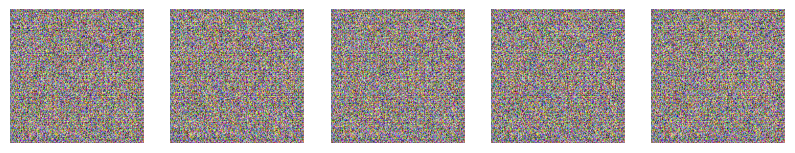

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

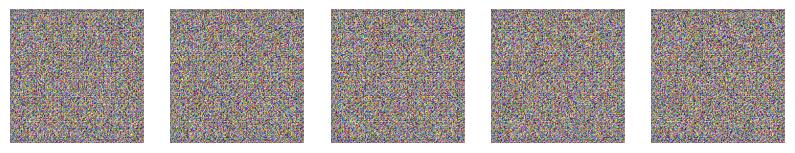

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

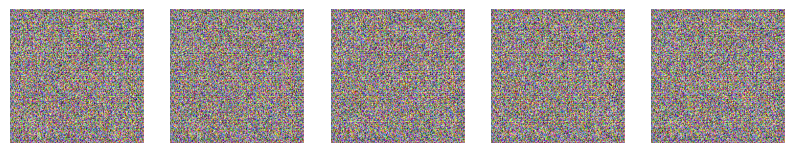

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

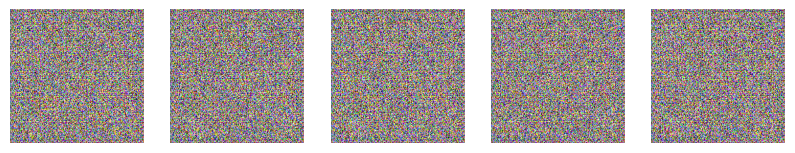

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

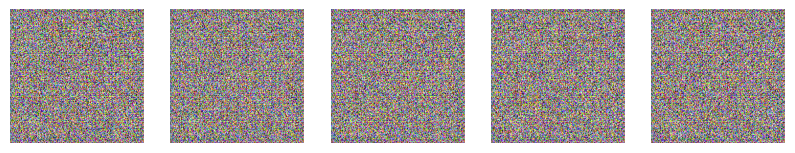

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

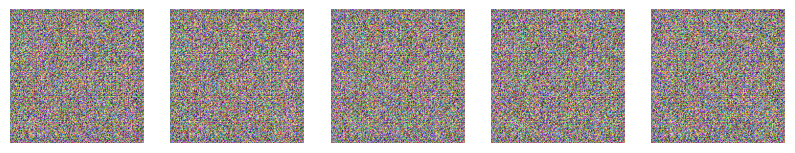

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

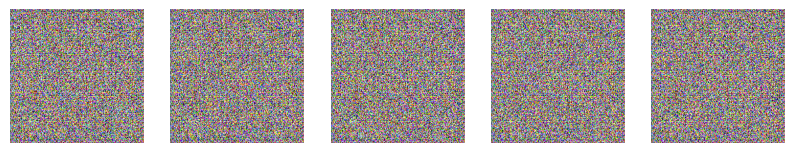

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

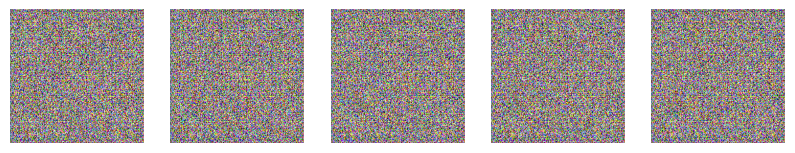

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

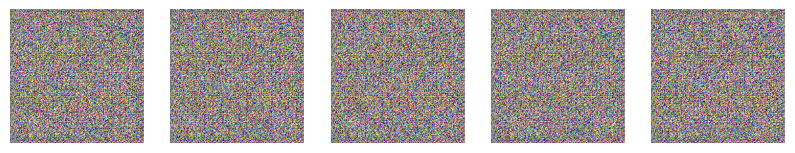

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

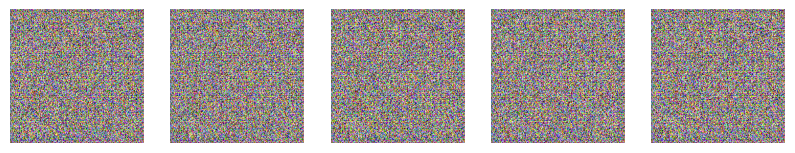

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

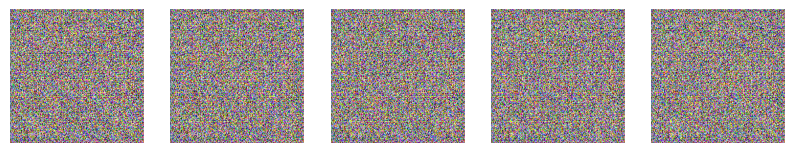

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

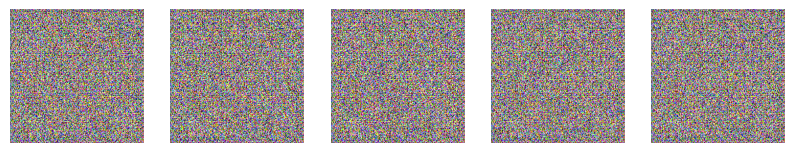

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

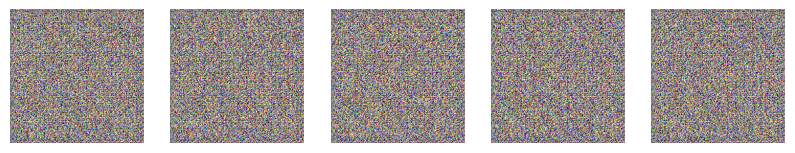

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

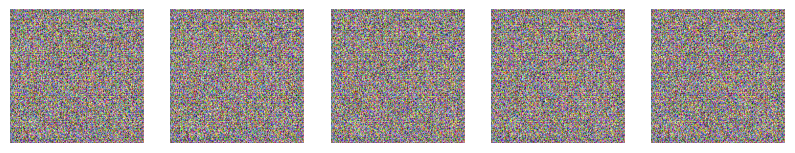

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

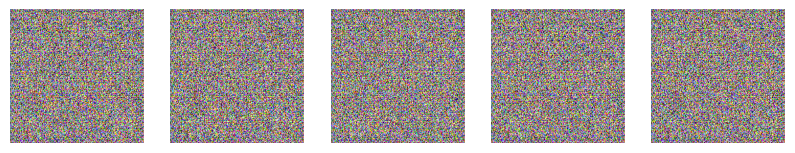

(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━

Exception ignored in: <function WeakKeyDictionary.__init__.<locals>.remove at 0x7ff195eef4c0>
Traceback (most recent call last):
  File "/usr/lib/python3.11/weakref.py", line 369, in remove
    def remove(k, selfref=ref(self)):

KeyboardInterrupt: 


(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)
(16, 256, 256, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
(16, 256, 256, 3)


KeyboardInterrupt: 

In [107]:
train_gan(dataset, epochs, batch_size, save_interval)

(100,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


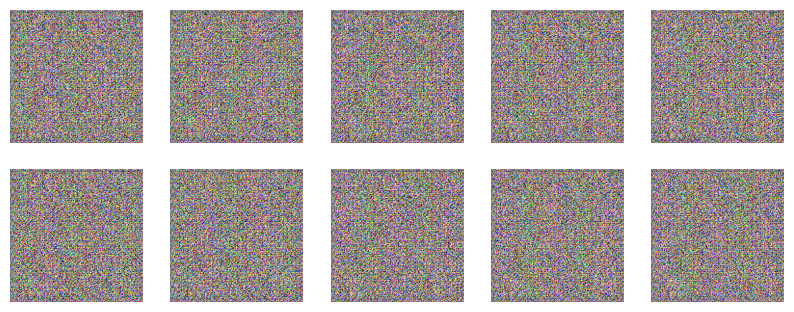

In [103]:
def generate_images(num_images=10):
    noise = np.random.randn(num_images, latent_dim)
    print(noise[0].shape)
    generated_images = generator.predict(noise)
    generated_images = 0.5 * generated_images + 0.5

    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(5, 5, i + 1)
        plt.imshow(generated_images[i])
        plt.axis("off")
    plt.show()

generate_images(10)

### Conclutions

- GANs models require a big number of epochs to be able to generate good images.
- The generated images may be blurry or lack fine-grained details. This could be due to ineffective loss functions, insufficient training, or architectural limitations.
- For future jobs, use a deeper generator and discriminator. Add a more complex generator NN, including more convolution operations.
- The other improvement that could be applied in this job is trying to use different GAN variants.